<!-- # TODO

- attach_results bug (possibly resolved)
- add asserts where appropriate
- Add FIFO optimization
- switch to QAT
- add table of contents
- update MNIST tutorial
- put reference design on Zenodo
- add doc comments

- allow user to make 8, 12, or 16 bit
- allow user to select Octo or Quad CXP-12
- include envionrment yml -->

# Part 9: Frame Grabbers

## Table of Contents
- Helpful functions for dataset
- Helpful functions for training
- Fetch MNSIT dataset
- Quantization Aware Training
    - Preview inference
- Extensions API for custom layer
- hls4ml model compilation
- HLS model profiling
- Simulate HLS model
- FIFO Optimization
- Frame grabber firmware integration
    - Acquisition parameters
    - C-simulation
    - C-synthesis
    - Implementation
    - Benchmarking

This tutorial will cover the training and deployment of YOLO-type neural networks to high-speed frame grabbers, as well as the hls4ml extensions API, HLS model profiling, and FIFO optimization.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import hls4ml
import shutil
import os 

import tensorflow as tf
import keras
from keras import layers
from keras import activations
from tensorflow.keras.optimizers import Adam
from keras.layers import Conv2D, Dense, BatchNormalization, MaxPooling2D, Activation, Flatten, AveragePooling2D, MaxPool2D, Concatenate
from qkeras.qlayers import QDense, QActivation
from qkeras.qconvolutional import QConv2D
from qkeras.qpooling import QAveragePooling2D
from qkeras.quantizers import quantized_bits, quantized_relu, smooth_sigmoid

2024-02-03 01:34:55.262275: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/rforelli/miniforge3/envs/fusion_fastml/lib/python3.8/site-packages/cv2/../../lib64:/home/rforelli/miniforge3/lib:
2024-02-03 01:34:55.262303: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


WARN: Unable to import optimizer(s) from expr_templates.py: No module named 'sympy'


## Helpful functions for dataset

This YOLO will have non-standard baby architecture suitable for deployment to smaller FPGA devices such as this (XCKU035). The dataset will consist of 128x128 frames with MNIST digits randomly inserted throughout. This model and code is adapted from Seachaos' Medium article [here](https://tree.rocks/a-simple-way-to-understand-and-implement-object-detection-from-scratch-by-pure-cnn-36cc28143ca8).

In [2]:
grid_size = 16  # image_size / mask_size

def make_numbers(X, y): 
    """
    Generates a new data sample by placing random MNIST digits around a 128x128 frame
    
    :param X: New empty YOLO data array
    :param y: New empty YOLO labels data array
    """
    
    for _ in range(3): # place three digits around the image
        
        idx = np.random.randint(len(X_num)) # pick a random digit to insert in frame 
        number = X_num[idx] # grab digit
        kls = y_num[idx]    # grab class
        
        px, py = np.random.randint(0, 100), np.random.randint(0, 100) # generate a random position for the digit
        
        # digit belong which mask position
        mx, my = (px+14) // grid_size, (py+14) // grid_size # calculate which mask region the digit will beglong to
        channels = y[my][mx]

        # prevent duplicates
        if channels[0] > 0:
            continue
            
        channels[0] = 1.0
        channels[1] = px - (mx * grid_size)  # x1
        channels[2] = py - (my * grid_size)  # y1
        channels[3] = 28.0                   # x2
        channels[4] = 28.0                   # y2
        channels[5 + kls] = 1.0
        
        # Insert digit to frame
        X[py:py+28, px:px+28] += number
        
def make_data(size=64):
    """
    Generates a new dataset for YOLO training
    
    :param size: Number of samples to generate for training, can be larger than MNIST dataset
    :return: New dataset and labels
    """

    X = np.zeros((size, 128, 128, 1), dtype=np.float32) # New data sample of 128x128
    y = np.zeros((size, 8, 8, 15), dtype=np.float32)    # New data output consists of probability, bounding box, and class
    
    # Generate data
    for i in range(size): 
        make_numbers(X[i], y[i])
        
    X = np.clip(X, 0.0, 1.0)
    return X, y

def show_predict(X, y, threshold=0.1):
    """
    Display single prediction results
    
    :param X: Data sample input
    :param y: Model predictions
    :param threshold: Probability threshold    
    """
    
    X = X.copy()
    for mx in range(8):
        for my in range(8):
            channels = y[my][mx]
            prob, x1, y1, x2, y2 = channels[:5]

            # if prob < threshold we won't show any thing
            if prob < threshold:
                continue
                                
            color = 255
            # bounding box
            px, py = (mx * grid_size) + x1, (my * grid_size) + y1
            cv2.rectangle(X, (int(px), int(py)), (int(px + x2), int(py + y2)), -1, 1)
            
            # label
            cv2.rectangle(X, (int(px), int(py - 10)), (int(px + 12), int(py)), -1, -1)
            kls = np.argmax(channels[5:])
            cv2.putText(X, f'{kls}', (int(px + 2), int(py-2)), cv2.FONT_HERSHEY_PLAIN, 0.7, (0.0, 0.0, 0.0))

            print("digit: " + str(np.argmax(channels[5:15])) + ", prob: " + str(prob) + ", x1: " + str(int(px)) + ", y1: " + str(int(py)) + ", x2: " + str(int(px + x2)) + ", y2: " + str(int(py + y2)))
            
    plt.imshow(X, cmap="gray")

## Helpful functions for training

In [3]:
idx_p = [0] # probability
idx_bb = [1, 2, 3, 4] # bounding box
idx_cls = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14] # class

@tf.function
def loss_bb(y_true, y_pred):
    y_true = tf.gather(y_true, idx_bb, axis=-1)
    y_pred = tf.gather(y_pred, idx_bb, axis=-1)

    loss = tf.keras.losses.mean_squared_error(y_true, y_pred)
    return tf.reduce_mean(loss[loss > 0.0])

@tf.function
def loss_p(y_true, y_pred):
    y_true = tf.gather(y_true, idx_p, axis=-1)
    y_pred = tf.gather(y_pred, idx_p, axis=-1)
    
    loss = tf.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_sum(loss)

@tf.function
def loss_cls(y_true, y_pred):
    y_true = tf.gather(y_true, idx_cls, axis=-1)
    y_pred = tf.gather(y_pred, idx_cls, axis=-1)
    
    loss = tf.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_sum(loss)

@tf.function
def loss_func(y_true, y_pred):
    return loss_bb(y_true, y_pred) + loss_p(y_true, y_pred) + loss_cls(y_true, y_pred)

opt = tf.keras.optimizers.Adam(learning_rate=0.003)

## Fetch MNSIT dataset

In [4]:
(X_num, y_num), _ = tf.keras.datasets.mnist.load_data()
X_num = np.expand_dims(X_num, axis=-1).astype(np.float32) / 255.0

Let's load  take a look at a sample of our data as well as the corrsponding labels

digit: 0, prob: 1.0, x1: 16, y1: 15, x2: 44, y2: 43
digit: 8, prob: 1.0, x1: 80, y1: 82, x2: 108, y2: 110


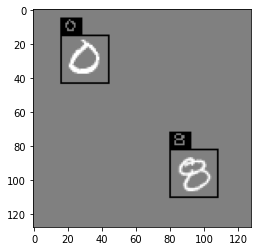

In [5]:
X, y = make_data(size=1)
show_predict(X[0], y[0])

## Quantization Aware Training

In [6]:
def baby_YOLO_conv():
    """
    Baby YOLO model architecture
    
    :return: Keras model
    """
    
    tf.compat.v1.reset_default_graph()
    x = inputs = keras.Input(shape=(128, 128, 1), name='input_1')

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(15,3,alpha=1), bias_quantizer=quantized_bits(7,0,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x) # size: 64x64

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,2,alpha=1), bias_quantizer=quantized_bits(7,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 64x64

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,3,alpha=1), bias_quantizer=quantized_bits(8,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 32x32

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,2,alpha=1), bias_quantizer=quantized_bits(10,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 16x16
    
    x_prob = QConv2D(1, kernel_size=3, padding='same', name='x_prob', activation='sigmoid', kernel_quantizer=quantized_bits(11,2,alpha=1), bias_quantizer=quantized_bits(2,1,alpha=1), kernel_initializer='lecun_uniform')(x)
    x_boxes = QConv2D(4, kernel_size=3, padding='same', name='x_boxes', kernel_quantizer=quantized_bits(17,3,alpha=1), bias_quantizer=quantized_bits(4,3,alpha=1), kernel_initializer='lecun_uniform')(x)
    x_cls = QConv2D(10, kernel_size=3, padding='same', name='x_cls', activation='sigmoid', kernel_quantizer=quantized_bits(20,2,alpha=1), bias_quantizer=quantized_bits(8,1,alpha=1), kernel_initializer='lecun_uniform')(x)
    
    gate = tf.where(x_prob > 0.5, tf.ones_like(x_prob), tf.zeros_like(x_prob))
    x_boxes = x_boxes * gate
    x_cls = x_cls * gate
    
    x = Concatenate()([x_prob, x_boxes])
    x = Concatenate()([x, x_cls])
   
    model = tf.keras.models.Model(inputs, x)
    return model

In [7]:
model = baby_YOLO_conv()
model.summary()

2024-02-03 01:34:57.870566: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/rforelli/miniforge3/envs/fusion_fastml/lib/python3.8/site-packages/cv2/../../lib64:/home/rforelli/miniforge3/lib:
2024-02-03 01:34:57.870593: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2024-02-03 01:34:57.870621: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (correlator2.fnal.gov): /proc/driver/nvidia/version does not exist
2024-02-03 01:34:57.870904: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild Tens

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 q_conv2d (QConv2D)             (None, 128, 128, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 q_activation (QActivation)     (None, 128, 128, 16  0           ['q_conv2d[0][0]']               
                                )                                                             

In [8]:
model.compile(loss=loss_func, optimizer=opt)

In [ ]:
batch_size = 32
X_train, y_train = make_data(size=batch_size * 400)
model.fit(X_train, y_train, batch_size=batch_size, epochs=30, shuffle=True)

In [11]:
# model.save_weights('weights/baby_yolo_weights.h5')
model.load_weights('weights/baby_yolo_weights.h5') # Load if you would like to skip training

### Preview inference

digit: 9, prob: 0.99534684, x1: 23, y1: 44, x2: 52, y2: 74
digit: 3, prob: 0.9713298, x1: 75, y1: 70, x2: 101, y2: 97
digit: 0, prob: 0.97744405, x1: 91, y1: 62, x2: 119, y2: 91


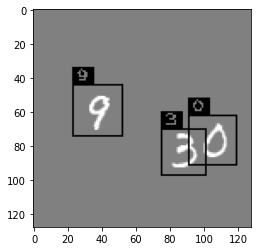

In [22]:
def preview(numbers=None, threshold=0.1):
    """
    View single model prediction
    
    :param threshold: Probability threshold
    """
    
    X, y = make_data(size=1)
    y = model.predict(X)
    show_predict(X[0], y[0], threshold=threshold)

preview(threshold=0.7)

## Extensions API for custom layer

The extensions API enables hls4ml users to implement custom layers in their model given the HLS implementation of the layer which is inserted to the HLS model. In this example, the custom layer we are inserting is not utilized during training but is actually for data reduction in hardware. The current model output is of shape (8,8,15) which can be transformed to sixty-four 33-bit values denoting a probability gated to a 1 or 0, four 7-bit bounding box coordinates, and a 4-bit class. The implementation for this layer is included in ``nnet_reduce.h``

In [23]:
class KReduce(tf.keras.layers.Layer):
    '''Keras implementation of custom layer'''
    
    def __init__(self):
        super().__init__()

    def call(self, inputs):
        # inputs: a tensor of shape(8,8,15)            
        return inputs[:, :, :, 0] # We want our hardware model output to be of shape (1,8,8,1)

class HReduce(hls4ml.model.layers.Layer):
    '''hls4ml implementation of custom layer'''

    def initialize(self):
        inp = self.get_input_variable()
        shape = list(inp.shape)
        shape[-1] = 1 # new output shape is (1,8,8,1)
        
        dims = ['OUT_HEIGHT_{}'.format(self.index), 'OUT_WIDTH_{}'.format(self.index), 'N_FILT_{}'.format(self.index)]
        
        self.add_output_variable(shape, dims)

def parse_reduce_layer(keras_layer, input_names, input_shapes, data_reader):
    '''Parser for converter'''
    
    layer = {}
    layer['class_name'] = 'HReduce'
    layer['name'] = keras_layer['config']['name']
    layer['n_in'] = input_shapes[0][1]*input_shapes[0][2]
    layer['grid_size'] = grid_size
    outshape = [[None, 8, 8]]

    if input_names is not None:
        layer['inputs'] = input_names

    return layer, outshape

# HLS model layer configuration
red_config_template = """struct config{index} : nnet::reduce_config {{
    static const unsigned n_in = {n_in};
    static const unsigned grid_size = {grid_size};
}};\n"""

red_function_template ='nnet::reduce<{input_t}, {output_t}, {config}>({input}, {output});'
red_include_list = ['nnet_utils/nnet_reduce.h']

class HReduceConfigTemplate(hls4ml.backends.template.LayerConfigTemplate):
    def __init__(self):
        super().__init__(HReduce)
        self.template = red_config_template

    def format(self, node):
        params = self._default_config_params(node)
        return self.template.format(**params)

class HReduceFunctionTemplate(hls4ml.backends.template.FunctionCallTemplate):
    '''New layer function template'''
    
    def __init__(self):
        super().__init__(HReduce, include_header=red_include_list)
        self.template = red_function_template

    def format(self, node):
        params = self._default_function_params(node)
        return self.template.format(**params)

# Register the converter for custom Keras layer
hls4ml.converters.register_keras_layer_handler('KReduce', parse_reduce_layer)

# Register the hls4ml's IR layer
hls4ml.model.layers.register_layer('HReduce', HReduce)

for backend_id in ['Vivado']:
    # Register the optimization passes (if any)
    backend = hls4ml.backends.get_backend(backend_id)

    # Register template passes for the given backend
    backend.register_template(HReduceConfigTemplate)
    backend.register_template(HReduceFunctionTemplate)

    # Register HLS implementation
    backend.register_source(os.path.abspath("lambda_cpp/nnet_reduce.h"))

Now define the model with the new layer and copy the weights over. This new model will not provide correct results in Python but will in hardware with the final ``reduce()`` layer

In [24]:
class quantized_relu(quantized_relu):
    ''' Workaround for quantized_relu __name__ not found bug '''
    def __init__(self, W, I):
        super(quantized_relu, self).__init__(W, I)
        self.__name__ = 'quantized_relu'

def baby_YOLO_conv_reduce():
    """
    Baby YOLO model architecture with new custom layer
    
    :return: Keras model
    """
    
    tf.compat.v1.reset_default_graph()
    x = inputs = keras.Input(shape=(128, 128, 1), name='input_1')

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(15,3,alpha=1), bias_quantizer=quantized_bits(7,0,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x) # size: 64x64

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,2,alpha=1), bias_quantizer=quantized_bits(7,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 64x64

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,3,alpha=1), bias_quantizer=quantized_bits(8,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 32x32

    x = QConv2D(16, kernel_size=3, padding='same', kernel_quantizer=quantized_bits(16,2,alpha=1), bias_quantizer=quantized_bits(10,2,alpha=1), kernel_initializer='lecun_uniform')(x)
    x = QActivation(activation=quantized_relu(16,8))(x)
    x = MaxPool2D()(x)
    x = BatchNormalization()(x)  # size: 16x16
    
    x_prob = QConv2D(1, kernel_size=3, padding='same', name='x_prob', activation='sigmoid', kernel_quantizer=quantized_bits(11,2,alpha=1), bias_quantizer=quantized_bits(2,1,alpha=1), kernel_initializer='lecun_uniform')(x)
    x_boxes = QConv2D(4, kernel_size=3, padding='same', name='x_boxes', kernel_quantizer=quantized_bits(17,3,alpha=1), bias_quantizer=quantized_bits(4,3,alpha=1), kernel_initializer='lecun_uniform')(x)
    x_cls = QConv2D(10, kernel_size=3, padding='same', name='x_cls', activation='sigmoid', kernel_quantizer=quantized_bits(20,2,alpha=1), bias_quantizer=quantized_bits(8,1,alpha=1), kernel_initializer='lecun_uniform')(x)

    x = Concatenate()([x_prob, x_boxes])
    x = Concatenate()([x, x_cls])

    x = KReduce()(x)

    model = tf.keras.models.Model(inputs, x)
    return model
    
model_reduce = baby_YOLO_conv_reduce()
model_reduce.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 q_conv2d (QConv2D)             (None, 128, 128, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 q_activation (QActivation)     (None, 128, 128, 16  0           ['q_conv2d[0][0]']               
                                )                                                             

In [25]:
model_reduce.load_weights('weights/baby_yolo_weights.h5')

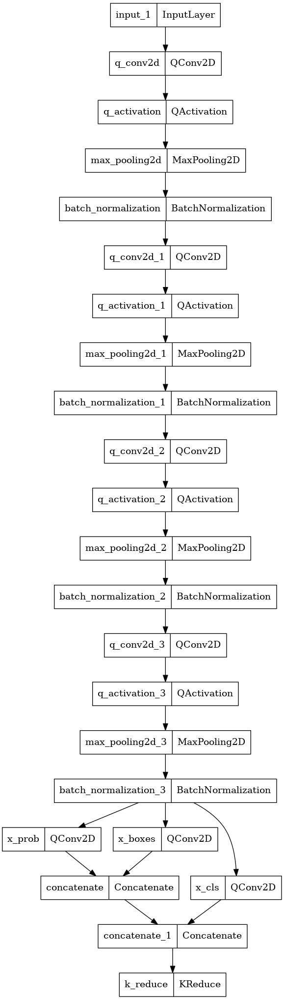

In [26]:
 tf.keras.utils.plot_model(model_reduce)

## Compile hls4ml model

Here we will compile the HLS representation of our model with the custom layer. Notice we set the output precision to 33 bits as previously described.

In [27]:
def print_dict(d, indent=0):
    """
    Prints dictionary to view hls4ml model config
    
    :return: Keras model
    """
    
    align = 20
    for key, value in d.items():
        print('  ' * indent + str(key), end='')
        if isinstance(value, dict):
            print()
            print_dict(value, indent+1)
        else:
            print(':' + ' ' * (20 - len(key) - 2 * indent) + str(value)) 

In [28]:
config = hls4ml.utils.config_from_keras_model (model_reduce,
                                                   default_precision = 'ap_fixed<16,8>',
                                                   granularity = 'name')

strategy = "Latency"
rf = 1
tracing = True
OUT_DIR = f'yolo_on_frame_grabber'

config["Model"]["Trace"] = tracing

config["Model"]["Strategy"] = "Resource"
for layer in config["LayerName"]:
    config["LayerName"][layer]["Trace"] = tracing
    config["LayerName"][layer]['ReuseFactor'] = rf
    config["LayerName"][layer]["Strategy"] = strategy
    
config["LayerName"]["q_conv2d"]['ReuseFactor'] = 1
config["LayerName"]["q_conv2d"]["Strategy"] = "Latency"
config["LayerName"]["q_conv2d"]["Precision"]["weight"] = "ap_fixed<15,3>"
config["LayerName"]["q_conv2d"]["Precision"]["bias"] = "ap_fixed<7,0>"

# config["LayerName"]["batch_normalization"]["Precision"]["scale"] = "ap_fixed<7,7>"
# config["LayerName"]["batch_normalization"]["Precision"]["bias"] = "ap_fixed<9,3>"

config["LayerName"]["q_conv2d_1"]['ReuseFactor'] = 4
config["LayerName"]["q_conv2d_1"]["Strategy"] = "Latency"
config["LayerName"]["q_conv2d_1"]["Precision"]["weight"] = "ap_fixed<16,2>"
config["LayerName"]["q_conv2d_1"]["Precision"]["bias"] = "ap_fixed<7,2>"

# config["LayerName"]["batch_normalization_1"]["Precision"]["scale"] = "ap_fixed<6,3>"
# config["LayerName"]["batch_normalization_1"]["Precision"]["bias"] = "ap_fixed<8,3>"

config["LayerName"]["q_conv2d_2"]['ReuseFactor'] = 12
config["LayerName"]["q_conv2d_2"]["Strategy"] = "Resource"
config["LayerName"]["q_conv2d_2"]["Precision"]["weight"] = "ap_fixed<16,3>"
config["LayerName"]["q_conv2d_2"]["Precision"]["bias"] = "ap_fixed<8,2>"

# config["LayerName"]["batch_normalization_2"]["Precision"]["scale"] = "ap_fixed<4,1>"
# config["LayerName"]["batch_normalization_2"]["Precision"]["bias"] = "ap_fixed<7,3>"

config["LayerName"]["q_conv2d_3"]['ReuseFactor'] = 48
config["LayerName"]["q_conv2d_3"]["Strategy"] = "Resource"
config["LayerName"]["q_conv2d_3"]["Precision"]["weight"] = "ap_fixed<16,2>"
config["LayerName"]["q_conv2d_3"]["Precision"]["bias"] = "ap_fixed<10,2>"

# config["LayerName"]["batch_normalization_3"]["Precision"]["scale"] = "ap_fixed<5,1>"
# config["LayerName"]["batch_normalization_3"]["Precision"]["bias"] = "ap_fixed<9,4>"

config["LayerName"]["x_prob"]['ReuseFactor'] = 48
config["LayerName"]["x_prob"]["Precision"]["weight"] = "ap_fixed<11,2>"
config["LayerName"]["x_prob"]["Precision"]["bias"] = "ap_fixed<2,1>"

config["LayerName"]["x_boxes"]['ReuseFactor'] = 48
config["LayerName"]["x_boxes"]["Precision"]["weight"] = "ap_fixed<17,3>"
config["LayerName"]["x_boxes"]["Precision"]["bias"] = "ap_fixed<4,3>"

config["LayerName"]["x_cls"]['ReuseFactor'] = 48
config["LayerName"]["x_cls"]["Precision"]["weight"] = "ap_fixed<20,2>"
config["LayerName"]["x_cls"]["Precision"]["bias"] = "ap_fixed<8,1>"

config["LayerName"]["k_reduce"]["Precision"]["result"] = "ap_uint<33>"

print_dict(config)
    
hls_model = hls4ml.converters.convert_from_keras_model(model_reduce,
                                                       hls_config = config,
                                                       io_type = 'io_stream',
                                                       output_dir = OUT_DIR,
                                                       part='xcku035-fbva676-2-e'
                                                       )

hls_model.compile()

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 1]
Layer name: q_conv2d, layer type: QConv2D, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 16]
Layer name: q_activation, layer type: Activation, input shapes: [[None, 128, 128, 16]], output shape: [None, 128, 128, 16]
Layer name: max_pooling2d, layer type: MaxPooling2D, input shapes: [[None, 128, 128, 16]], output shape: [None, 64, 64, 16]
Layer name: batch_normalization, layer type: BatchNormalization, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_conv2d_1, layer type: QConv2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_activation_1, layer type: Activation, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: max_pooling2d_1, layer type: MaxPooling2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 32, 32, 16]


Done


## HLS model profiling

Now we will take a look two very useful types of plots. The first is to compare the precision ranges of our model weights to the precision able to represented by the HLS model's fixed-point precision types. The second compares the model outputs of our HLS model to the Keras model. We will disregard the ``reduce`` layer output since our keras model does not implement that layer. These plots give us a sense of what precisions we should set for each layer to optimize accuracy and resources.

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 1]
Layer name: q_conv2d, layer type: QConv2D, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 16]
Layer name: q_activation, layer type: Activation, input shapes: [[None, 128, 128, 16]], output shape: [None, 128, 128, 16]
Layer name: max_pooling2d, layer type: MaxPooling2D, input shapes: [[None, 128, 128, 16]], output shape: [None, 64, 64, 16]
Layer name: batch_normalization, layer type: BatchNormalization, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_conv2d_1, layer type: QConv2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_activation_1, layer type: Activation, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: max_pooling2d_1, layer type: MaxPooling2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 32, 32, 16]


Done
   q_conv2d
   q_activation
   max_pooling2d
   batch_normalization
   q_conv2d_1
   q_activation_1
   max_pooling2d_1
   batch_normalization_1
   q_conv2d_2
   q_activation_2
   max_pooling2d_2
   batch_normalization_2
   q_conv2d_3
   q_activation_3
   max_pooling2d_3
   batch_normalization_3
   x_prob
   x_prob_sigmoid
   x_boxes
   concatenate
   x_cls
   x_cls_sigmoid
   concatenate_1
   k_reduce


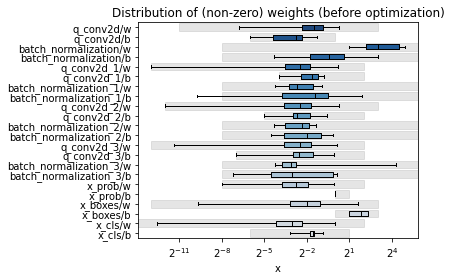

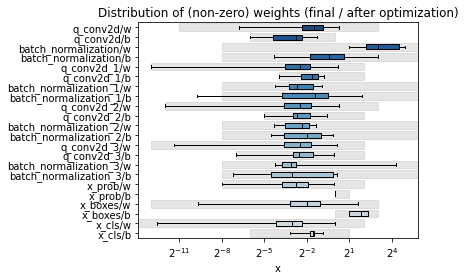

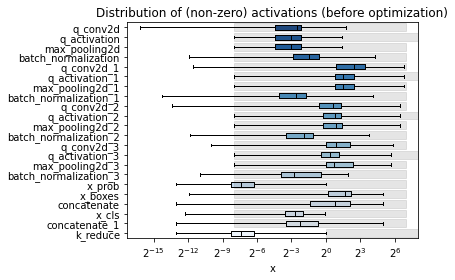

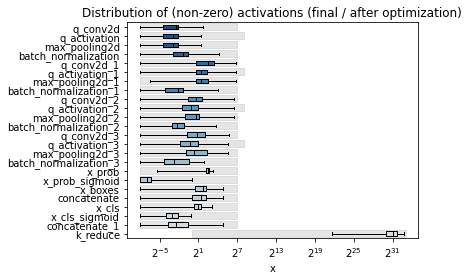

In [29]:
#Compare weights ranges between float and HLS model
X, y = make_data(size=10)
%matplotlib inline
plots = hls4ml.model.profiling.numerical(model=model_reduce, hls_model = hls_model, X=np.ascontiguousarray(X))

Done taking outputs for Keras model.
Recompiling myproject with tracing
Writing HLS project


Done


/tmp/ipykernel_78708/169818282.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


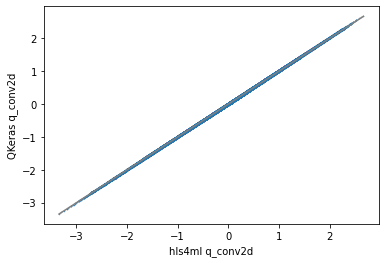

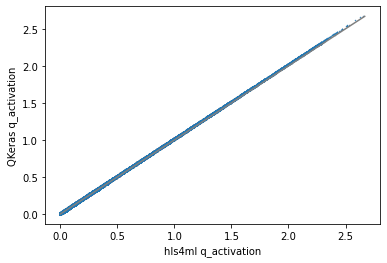

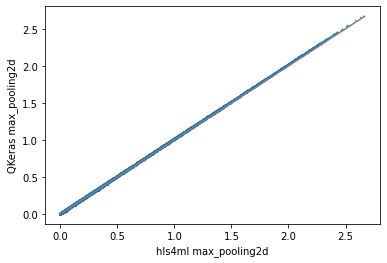

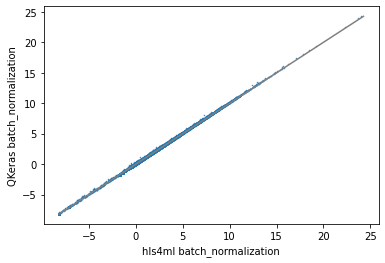

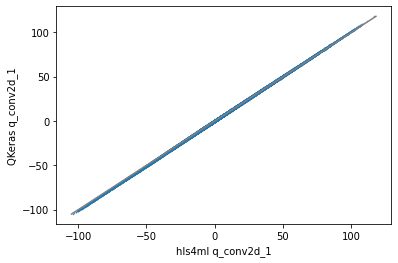

...

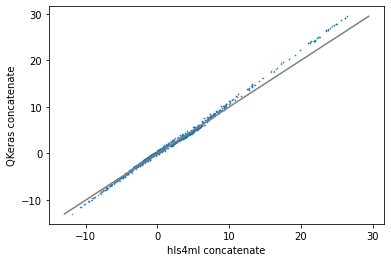

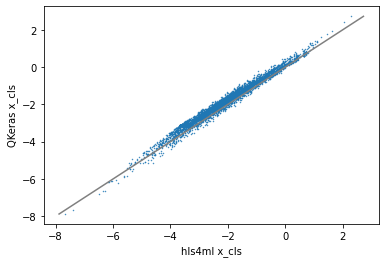

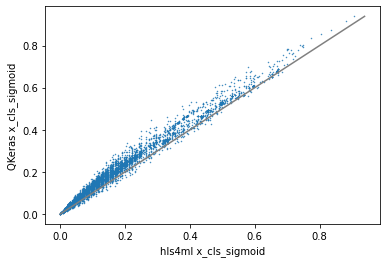

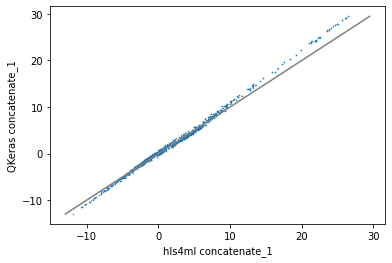

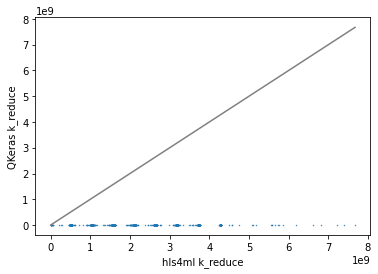

In [18]:
#Trace Model
keras_trace = hls4ml.model.profiling.get_ymodel_keras(model_reduce, np.ascontiguousarray(X))
y_hls, hls4ml_trace = hls_model.trace(np.ascontiguousarray(X))

#Compare layer outputs
for layer in hls4ml_trace.keys():
            plt.figure()
            klayer = layer
            if "_alpha" in layer:
                klayer = layer.replace("_alpha", "")
            plt.scatter(hls4ml_trace[layer].flatten(), keras_trace[klayer].flatten(), s=0.2)
            min_x = min(np.amin(hls4ml_trace[layer]), np.amin(keras_trace[klayer]))
            max_x = max(np.amax(hls4ml_trace[layer]), np.amax(keras_trace[klayer]))
            plt.plot([min_x, max_x], [min_x, max_x], c="gray")
            plt.xlabel("hls4ml {}".format(layer))
            plt.ylabel("QKeras {}".format(klayer))

## Simulate HLS model

Before we integrate our neural network into the frame grabber reference design. Lets make sure it's providing solid results by running csim. We will need to save our test data to the testbennch folder

In [30]:
# hls_predictions = hls_model.predict(X.reshape(X.shape[0], -1)).astype(np.uint64) # Not providing correct predictions
np.savetxt(OUT_DIR + "/tb_data/tb_input_features.dat", X.reshape(X.shape[0], -1), delimiter=' ')
np.savetxt(OUT_DIR + "/tb_data/tb_output_predictions.dat", np.zeros(y.shape[0:3]).reshape(y.shape[0], -1), delimiter=' ')

In [31]:
hls_model.build(csim=True, synth=False, cosim=False, validation=False, vsynth=False, fifo_opt=False, export=False)


****** Vivado(TM) HLS - High-Level Synthesis from C, C++ and SystemC v2018.3 (64-bit)
  **** SW Build 2405991 on Thu Dec  6 23:36:41 MST 2018
  **** IP Build 2404404 on Fri Dec  7 01:43:56 MST 2018
    ** Copyright 1986-2018 Xilinx, Inc. All Rights Reserved.

source /data1/rforelli/Xilinx_2018/Vivado/2018.3/scripts/vivado_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/data1/rforelli/Xilinx_2018/Vivado/2018.3/bin/unwrapped/lnx64.o/vivado_hls'
INFO: [HLS 200-10] For user 'rforelli' on host 'correlator2.fnal.gov' (Linux_x86_64 version 3.10.0-1160.99.1.el7.x86_64) on Sat Feb 03 01:39:03 CST 2024
INFO: [HLS 200-10] On os "Scientific Linux release 7.9 (Nitrogen)"
INFO: [HLS 200-10] In directory '/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber'
INFO: [HLS 200-10] Opening project '/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj'.
INFO: [HLS 200-10] Adding design file 'firmware/myproject.cpp' to the project
INFO: [HLS 200-10] Adding test bench file 'mypro

{'CSimResults': [['33040416',
   '402690144',
   '1039736880',
   '1609930753',
   '2146834433',
   '2717296656',
   '3221170240',
   '3690436641',
   '37237042',
   '4532793890',
   '943528291',
   '1547016481',
   '2117736736',
   '2620830032',
   '3226147168',
   '3695151409',
   '4268237329',
   '442286629',
   '946938418',
   '1551475280',
   '2122193456',
   '2692903392',
   '7523517238',
   '3531055745',
   '4273476368',
   '481598240',
   '1052056336',
   '1556181760',
   '2126388023',
   '2629475121',
   '3198892833',
   '3568274210',
   '4277668880',
   '486050848',
   '1124412497',
   '5619981732',
   '1996625009',
   '2633667616',
   '3203603457',
   '3741029392',
   '4281863440',
   '523803937',
   '1093479681',
   '1462084897',
   '2033589568',
   '2637862176',
   '3174767904',
   '3745223952',
   '4286058000',
   '527996448',
   '1064640017',
   '1534434849',
   '2104892961',
   '2642056736',
   '3178962464',
   '3749418512',
   '4257224528',
   '499165024',
   '10360687

In [34]:
hls_predictions = np.genfromtxt(OUT_DIR + "/tb_data/csim_results.log", delimiter=' ')

digit: 2, prob: 1, x1: 7, y1: 11, x2: 30, y2: 34
digit: 6, prob: 1, x1: 96, y1: 27, x2: 120, y2: 51
digit: 4, prob: 1, x1: 39, y1: 62, x2: 67, y2: 90


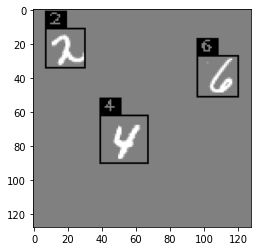

In [35]:
def bit_range(num, end_idx, start_idx):
    """
    Extracts bit range from integer
    
    :param num: Number from which to extract bits
    :param end_idx: Ending index (inclusive) from the right in the binary representation
    :param start_idx: Starting index (inclusive) from the right in the binary representation
    :return: Extracted bit range as an integer
    """
    mask = ((1 << (end_idx + 1)) - 1) - ((1 << start_idx) - 1)
    return (num & mask) >> start_idx


def show_predict_hardware(X, y):
    """
    Display single prediction results from the hardware (parsed from the output bit strings)
    
    :param X: Data sample input
    :param y: Model predictions
    """
    
    X = X.copy()
    channels = np.zeros((6), dtype=np.uint64)
    
    for i in range(64):
        channels[0] = bit_range(int(y[i]), 32, 32)
        channels[1] = bit_range(int(y[i]), 31, 25)
        channels[2] = bit_range(int(y[i]), 24, 18)
        channels[3] = bit_range(int(y[i]), 17, 11)
        channels[4] = bit_range(int(y[i]), 10, 4)
        channels[5] = bit_range(int(y[i]), 3, 0)
        
        if channels[0] < 1:
            continue

        color = 255
        # bounding box
        cv2.rectangle(X, (channels[1], channels[2]), (channels[3], channels[4]), -1, 1)

        print("digit: " + str(channels[5]) + ", prob: " + str(channels[0]) + ", x1: " + str(int(channels[1])) + ", y1: " + str(int(channels[2])) + ", x2: " + str(int(channels[3])) + ", y2: " + str(int(channels[4])))

        # label
        cv2.rectangle(X, (int(channels[1]), int(channels[2]-10)), (int(channels[1]+12), int(channels[2])), -1, -1)
        kls = channels[5]
        cv2.putText(X, f'{kls}', (int(channels[1]+2), int(channels[2]-2)), cv2.FONT_HERSHEY_PLAIN, 0.7, (0.0, 0.0, 0.0))

    plt.imshow(X, cmap="gray")
    
show_predict_hardware(X[0], hls_predictions[0])

## FIFO Optimization

Now we will run a fifo optimization. This process will optimize the depths of the FIFOs used to connect one layer to the next and will save tremendously on BRAM resources. Note that this process requires that we recompile our HLS model which will run c-simulation, c synthesis, and RTL simulation. This process is automated but can take some time. The HLS will automatically be updated with the new FIFO depths.

In [23]:
# Comment out the following two lines to disable FIFO depth optimization
config['Flows'] = ['vivado:fifo_depth_optimization']
hls4ml.model.optimizer.get_optimizer('vivado:fifo_depth_optimization').configure(profiling_fifo_depth=100_000)

In [24]:
hls_model = hls4ml.converters.convert_from_keras_model(model_reduce,
                                                       hls_config = config,
                                                       io_type = 'io_stream',
                                                       output_dir = OUT_DIR,
                                                       part='xcku035-fbva676-2-e'
                                                       )

hls_model.compile()

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 1]
Layer name: q_conv2d, layer type: QConv2D, input shapes: [[None, 128, 128, 1]], output shape: [None, 128, 128, 16]
Layer name: q_activation, layer type: Activation, input shapes: [[None, 128, 128, 16]], output shape: [None, 128, 128, 16]
Layer name: max_pooling2d, layer type: MaxPooling2D, input shapes: [[None, 128, 128, 16]], output shape: [None, 64, 64, 16]
Layer name: batch_normalization, layer type: BatchNormalization, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_conv2d_1, layer type: QConv2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: q_activation_1, layer type: Activation, input shapes: [[None, 64, 64, 16]], output shape: [None, 64, 64, 16]
Layer name: max_pooling2d_1, layer type: MaxPooling2D, input shapes: [[None, 64, 64, 16]], output shape: [None, 32, 32, 16]


Done

****** Vivado(TM) HLS - High-Level Synthesis from C, C++ and SystemC v2018.3 (64-bit)
  **** SW Build 2405991 on Thu Dec  6 23:36:41 MST 2018
  **** IP Build 2404404 on Fri Dec  7 01:43:56 MST 2018
    ** Copyright 1986-2018 Xilinx, Inc. All Rights Reserved.

source /data1/rforelli/Xilinx_2018/Vivado/2018.3/scripts/vivado_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/data1/rforelli/Xilinx_2018/Vivado/2018.3/bin/unwrapped/lnx64.o/vivado_hls'
INFO: [HLS 200-10] For user 'rforelli' on host 'correlator2.fnal.gov' (Linux_x86_64 version 3.10.0-1160.99.1.el7.x86_64) on Fri Feb 02 23:46:02 CST 2024
INFO: [HLS 200-10] On os "Scientific Linux release 7.9 (Nitrogen)"
INFO: [HLS 200-10] In directory '/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber'
INFO: [HLS 200-10] Opening project '/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj'.
INFO: [HLS 200-10] Adding design file 'firmware/myproject.cpp' to the project
INFO: [HLS 200-10] Adding test bench file '

INFO: [XFORM 203-603] Inlining function 'nnet::shift_line_buffer<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, config15>' into 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config15>' (firmware/nnet_utils/nnet_pooling_stream.h:188->firmware/nnet_utils/nnet_pooling_stream.h:247->firmware/nnet_utils/nnet_pooling_stream.h:257).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config15>' (firmware/nnet_utils/nnet_pooling_stream.h:21->firmware/nnet_utils/nnet_pooling_stream.h:204->firmware/nnet_utils/nnet_pooling_stream.h:247->firmware/nnet_utils/nnet_pooling_stream.h:257).
INFO: [XFORM 203-

INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>::operator[]' into 'nnet::reduce<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>, nnet::array<ap_uint<33>, 1u>, config30>' (firmware/nnet_utils/nnet_reduce.h:30).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_uint<33>, 1u>::operator[]' into 'nnet::reduce<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>, nnet::array<ap_uint<33>, 1u>, config30>' (firmware/nnet_utils/nnet_reduce.h:30).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_uint<33>, 1u>::operator[]' into 'nnet::reduce<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>, nnet::array<ap_uint<33>, 1u>, config30>' (firmware/nnet_utils/nnet_reduce.h:33).
INFO: [XFORM 203-603] Inlining function 'nnet::array<ap_uint<33>, 1u>::operator[]' into 'nnet::reduce<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>, nnet::array<ap_uint<33>, 1u>, config30>' (firmwar

INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ConcatLoopWidth' (firmware/nnet_utils/nnet_merge_stream.h:234) in function 'nnet::concatenate3d_2<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 5u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 15u>, config29>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'ConcatLoopWidth' (firmware/nnet_utils/nnet_merge_stream.h:234) in function 'nnet::concatenate3d_2<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 1u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 5u>, config26>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'CloneLoop' (firmware/nnet_utils/nnet_stream.h:46) in function 'nnet::clone_stream<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q

INFO: [HLS 200-489] Unrolling loop 'Loop-1.1' (firmware/nnet_utils/nnet_padding_stream.h:11) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config36>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.1' (firmware/nnet_utils/nnet_padding_stream.h:11) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config36>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.2.1' (firmware/nnet_utils/nnet_padding_stream.h:22) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config36>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'Loop-2.3' (firmware/nnet_utils/nnet_padding_stream.h:11) in fu

INFO: [HLS 200-489] Unrolling loop 'KernelPushHeight' (firmware/nnet_utils/nnet_conv_stream.h:210) in function 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config5>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'KernelPushChannel' (firmware/nnet_utils/nnet_conv_stream.h:213) in function 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config5>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'FiltLoop' (firmware/nnet_utils/nnet_pooling_stream.h:193) in function 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config5>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'PoolLoop' (firmware/nnet_utils/nnet_pooling_stream.

INFO: [HLS 200-489] Unrolling loop 'BatchNormpack' (firmware/nnet_utils/nnet_batchnorm_stream.h:33) in function 'nnet::normalize<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'BatchNormpack' (firmware/nnet_utils/nnet_batchnorm_stream.h:33) in function 'nnet::normalize<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config21>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'BatchNormpack' (firmware/nnet_utils/nnet_batchnorm_stream.h:33) in function 'nnet::normalize<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config16>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'BatchNormpack' (firmware/nnet_utils/nnet_batchnorm_st

INFO: [HLS 200-489] Unrolling loop 'UpdateBuffer' (firmware/nnet_utils/nnet_conv_stream.h:233) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:241) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferShift' (firmware/nnet_utils/nnet_conv_stream.h:244) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolling loop 'KernelShiftWidth' (firmware/nnet_utils/nnet_conv_stream.h:194) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' completely with a factor of 2.
INFO: [HLS 200-489] Unrolli

INFO: [HLS 200-489] Unrolling loop 'Result' (firmware/nnet_utils/nnet_dense_resource.h:77) in function 'nnet::dense_resource<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config12_mult>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'UpdateBuffer' (firmware/nnet_utils/nnet_conv_stream.h:233) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config12>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferDataIn' (firmware/nnet_utils/nnet_conv_stream.h:241) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config12>' completely with a factor of 16.
INFO: [HLS 200-489] Unrolling loop 'LineBufferShift' (firmware/nnet_utils/nnet_conv_stream.h:244) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config12>' completely with a factor of 2.
IN

INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.34' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.28' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.22' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.4' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.10' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-102] Partitioning array 'res_part.data.V.16' (firmware/nnet_utils/nnet_padding_stream.h:21) automatically.
INFO: [XFORM 203-131] Reshaping array 'w17.V'  in dimension 1 with a block factor of 48.
INFO: [XFORM 203-131] Reshaping array 'w12.V'  in dimension 1 with a block factor of 192.
INFO: [XFORM 203-102] Automatically partitioning shift register array 'line_bu

INFO: [XFORM 203-101] Partitioning array 'pool_window.V' (firmware/nnet_utils/nnet_pooling_stream.h:178) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.7'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:229) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.6' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'tmp.data.V.46' in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'pool_window.V' (firmware/nnet_utils/nnet_pooling_stream.h:178) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'kernel_data.V.6'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:229) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 's6.V'  in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'b6.V'  i

INFO: [XFORM 203-101] Partitioning array 'layer20_out.V.data.V' (firmware/myproject.cpp:123) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer15_out.V.data.V' (firmware/myproject.cpp:103) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer10_out.V.data.V' (firmware/myproject.cpp:83) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer21_out.V.data.V' (firmware/myproject.cpp:127) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer24_out.V.data.V' (firmware/myproject.cpp:159) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'layer26_out.V.data.V' (firmware/myproject.cpp:163) in dimension 1 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Array.V.10'  in dimension 2 completely.
INFO: [XFORM 203-101] Partitioning array 'shift_buffer.V' (firmware/nnet_utils/nnet_conv_stream.h:229) in dimension 2 completely.
INFO: [XFORM 203-101] Partitioning array 'line_buffer.Arr

INFO: [XFORM 203-622] Instantiating function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config27_mult>.0.0.0.0.0'(firmware/nnet_utils/nnet_mult.h:26:9) to 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config27_mult>.0.0.0.0.0.0' at call site (firmware/nnet_utils/nnet_conv_stream.h:294) by setting 'biases[4].V' to 'b27.V.4'.
INFO: [XFORM 203-622] Instantiating function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config27_mult>.0.0.0.0.0.0'(firmware/nnet_utils/nnet_mult.h:26:9) to 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config27_mult>.0.0.0.0.0.0.0' at call site (firmware/nnet_utils/nnet_conv_stream.h:294) by setting 'biases[5].V' to 'b27.V.5'.
INFO: [XFORM 203-622] Instantiating function 'nnet::de

INFO: [XFORM 203-622] Instantiating function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config7_mult>.0.0.0.0.0.0'(firmware/nnet_utils/nnet_dense_latency.h:26:27) to 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config7_mult>.0.0.0.0.0.0.0' at call site (firmware/nnet_utils/nnet_conv_stream.h:294) by setting 'biases[5].V' to 'b7.V.5'.
INFO: [XFORM 203-622] Instantiating function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config7_mult>.0.0.0.0.0.0.0'(firmware/nnet_utils/nnet_dense_latency.h:26:27) to 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config7_mult>.0.0.0.0.0.0.0.0' at call site (firmware/nnet_utils/nnet_conv_stream.h:294) by setting 'biases[6].V' to 'b7.V.6'.
INFO: [XFORM 203-622] Instantiat

INFO: [XFORM 203-712] Applying dataflow to function 'myproject', detected/extracted 32 process function(s): 
	 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 1u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 1u>, config32>'
	 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 1u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config2>'
	 'nnet::relu<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, relu_config4>'
	 'nnet::pooling2d_cl<nnet::array<ap_ufixed<16, 8, (ap_q_mode)4, (ap_o_mode)0, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config5>'
	 'nnet::normalize<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config6>'
	 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0

INFO: [XFORM 203-11] Balancing expressions in function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config7_mult>.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0' (firmware/nnet_utils/nnet_mult.h:26:9)...2304 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0.0' (firmware/nnet_utils/nnet_dense_latency.h:26:13)...144 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, config27_mult>.0.0.0.0.0.0.0.0.0.0.0' (firmware/nnet_utils/nnet_mult.h:26:9)...1440 expression(s) balanced.
INFO: [XFORM 203-11] Balancing expressions in function 'nnet::dense_latency<ap_fixed<16, 8, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fi

INFO: [XFORM 203-531] Rewinding loop 'ReuseLoop' (firmware/nnet_utils/nnet_dense_resource.h:43) in function 'dense_resource<ap_fixed,ap_fixed<16,8,5,3,0>,config17_mult>'.
INFO: [XFORM 203-531] Rewinding loop 'ReuseLoop' (firmware/nnet_utils/nnet_dense_resource.h:43) in function 'dense_resource<ap_fixed,ap_fixed<16,8,5,3,0>,config12_mult>'.
INFO: [HLS 200-111] Finished Architecture Synthesis Time (s): cpu = 00:15:40 ; elapsed = 00:15:43 . Memory (MB): peak = 5424.035 ; gain = 5000.160 ; free physical = 19330 ; free virtual = 135486
INFO: [HLS 200-10] Starting hardware synthesis ...
INFO: [HLS 200-10] Synthesizing 'myproject' ...


INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_ap_fixed_1u_array_ap_fixed_16_8_5_3_0_1u_config32_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 943.99 seconds; current allocated memory: 1.124 GB.
INFO: [HLS 200-434] Only 0 loops out of a total 4 loops have been pipelined in this design.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 0.24 seconds; current allocated memory: 1.124 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200

INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 7.17 seconds; current allocated memory: 1.167 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config33_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 0.65 seconds; current allocated memory: 1.167 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 0.37 seconds; current allocated memory: 1.168 GB.
INFO: [HLS 200-10] --------------------------------------

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 0.38 seconds; current allocated memory: 1.370 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining function 'shift_line_buffer<array<ap_fixed<16, 8, 5, 3, 0>, 16u>, config12>'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 1.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 0.5 seconds; current allocated memory: 1.371 GB.
INFO: [BIND 20

INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 1.03 seconds; current allocated memory: 1.442 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'dense_resource_ap_fixed_ap_fixed_16_8_5_3_0_config17_mult_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReuseLoop'.
INFO: [SCHED 204-61] Pipelining result : Target II = 1, Final II = 1, Depth = 4.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 4.64 seconds; current allocated memory: 1.445 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [B

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config36_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 0.5 seconds; current allocated memory: 1.472 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 0.39 seconds; current allocated memory: 1.473 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config22_s' 
INFO: [HLS 200-1

INFO: [HLS 200-111]  Elapsed time: 10.55 seconds; current allocated memory: 1.509 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 2.44 seconds; current allocated memory: 1.514 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_4u_config24_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReadInputHeight_ReadInputWidth'.
INFO: [SCHED 204-61] Pipelining result : Target II = 48, Final II = 48, Depth = 50.
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 2.

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_15u_config29_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111]  Elapsed time: 0.3 seconds; current allocated memory: 1.581 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111]  Elapsed time: 0.2 seconds; current allocated memory: 1.582 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'reduce_array_ap_fixed_16_8_5_3_0_15u_array_ap_uint_33_1u_config30_s' 
I

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_V_10_0_0' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_dEe' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_V_10_0_1' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_eOg' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_V_10_0_2' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_fYi' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_V_10_0_3' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config5_s_line_buffer_Array_g8j' due to the length limit 80
INFO: [SYN 201-210] Renamed object n

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_V_2_0_6' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_VFfa' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_V_2_1_6' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_VGfk' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_V_2_0_7' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_VHfu' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_V_2_1_7' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config7_s_line_buffer_Array_VIfE' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shi

INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_16u_config7_s'.
INFO: [HLS 200-111]  Elapsed time: 65.56 seconds; current allocated memory: 1.928 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config7_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config7_s'.
INFO: [HLS 200-111]  Elapsed time: 10.29 seconds; current allocated memory: 1.938 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_ap_fixed_16u_array_ap_ufixed_16_8_4_0_0_16u_relu_config9_s' 
INFO: [HLS 200-10] ------------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array_V_6_0_0' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_ArrayZio' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array_V_6_0_1' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array0iy' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array_V_6_0_2' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array1iI' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array_V_6_0_3' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config10_s_line_buffer_Array2iS' due to the length limit 80
INFO: [SYN 201-210] Renamed object n

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_V_1638_5' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_bqm' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_V_0_6' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_brm' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_V_1638_6' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_bsm' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_V_0_7' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config12_s_line_buffer_Array_btn' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 's

INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_16u_config12_s'.
INFO: [HLS 200-111]  Elapsed time: 15.35 seconds; current allocated memory: 2.322 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config12_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config12_s'.
INFO: [HLS 200-111]  Elapsed time: 5.05 seconds; current allocated memory: 2.330 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_ap_fixed_16u_array_ap_ufixed_16_8_4_0_0_16u_relu_config14_s' 
INFO: [HLS 200-10] ---------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_Array_V_7_0_0' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_ArraybLp' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_Array_V_7_0_1' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_ArraybMq' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_Array_V_7_0_2' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_ArraybNq' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_Array_V_7_0_3' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config15_s_line_buffer_ArraybOq' due to the length limit 80
INFO: [SYN 201-210] Renamed object n

INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_V_1_1_4' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_cau' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_V_1_0_5' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_cbu' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_V_1_1_5' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_ccu' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_V_1_0_6' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config17_s_line_buffer_Array_cdu' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 

INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_16u_config17_s'.
INFO: [HLS 200-111]  Elapsed time: 9.51 seconds; current allocated memory: 2.508 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config17_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config17_s'.
INFO: [HLS 200-111]  Elapsed time: 4.68 seconds; current allocated memory: 2.516 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_ap_fixed_16u_array_ap_ufixed_16_8_4_0_0_16u_relu_config19_s' 
INFO: [HLS 200-10] ----------------------------------------------------------

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Array_V_9_0_0' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Arraycxx' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Array_V_9_0_1' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Arraycyx' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Array_V_9_0_2' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Arrayczy' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_Array_V_9_0_3' to 'pooling2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config20_s_line_buffer_ArraycAy' due to the length limit 80
INFO: [SYN 201-210] Renamed object n

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config36_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_16_8_5_3_0_16u_config36_s'.
INFO: [HLS 200-111]  Elapsed time: 3.18 seconds; current allocated memory: 2.541 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config22_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SYN 201-210] Renamed object name 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config22_s_line_buffer_Array_V_3_0_0' to 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config22_s_line_buffer_Array_cNA' due to the length limit 80
I

INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config22_s'.
INFO: [HLS 200-111]  Elapsed time: 4.69 seconds; current allocated memory: 2.589 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_latency_ap_fixed_ap_fixed_16_8_5_3_0_config22_mult_0_0' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'dense_latency_ap_fixed_ap_fixed_16_8_5_3_0_config22_mult_0_0'.
INFO: [HLS 200-111]  Elapsed time: 3.99 seconds; current allocated memory: 2.598 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_1u_config22_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_1u_config22_s'.
INFO: [HLS 200-111]  Elapsed time: 10.08 seconds; current allocated memory: 2.638 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_1u_config22_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_1u_config22_s'.
INFO: [HLS 200-111]  Elapsed time: 5.02 seconds; current allocated memory: 2.645 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'sigmoid_array_array_ap_fixed_16_8_5_3_0_1u_sigmoid_config23_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO

INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config24_s'.
INFO: [HLS 200-111]  Elapsed time: 4.61 seconds; current allocated memory: 2.693 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_latency_ap_fixed_ap_fixed_16_8_5_3_0_config24_mult_0_0_0_0_0' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'dense_latency_ap_fixed_ap_fixed_16_8_5_3_0_config24_mult_0_0_0_0_0'.
INFO: [HLS 200-111]  Elapsed time: 4.44 seconds; current allocated memory: 2.708 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_4u_config24_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_4u_config24_s'.
INFO: [HLS 200-111]  Elapsed time: 19.57 seconds; current allocated memory: 2.773 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_4u_config24_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_4u_config24_s'.
INFO: [HLS 200-111]  Elapsed time: 6.5 seconds; current allocated memory: 2.781 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_5u_config26_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
I

INFO: [RTGEN 206-100] Finished creating RTL model for 'shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config27_s'.
INFO: [HLS 200-111]  Elapsed time: 5.21 seconds; current allocated memory: 2.829 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_latency_ap_fixed_ap_fixed_config27_mult_0_0_0_0_0_0_0_0_0_0_0' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'dense_latency_ap_fixed_ap_fixed_config27_mult_0_0_0_0_0_0_0_0_0_0_0'.
INFO: [HLS 200-111]  Elapsed time: 5.65 seconds; current allocated memory: 2.860 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_10u_config27_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTGEN 206-100] Finished creating RTL model for 'compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_10u_config27_s'.
INFO: [HLS 200-111]  Elapsed time: 43.54 seconds; current allocated memory: 2.979 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_10u_config27_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_10u_config27_s'.
INFO: [HLS 200-111]  Elapsed time: 9.59 seconds; current allocated memory: 2.988 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'sigmoid_array_array_ap_fixed_16_8_5_3_0_10u_sigmoid_config28_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------


INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_9_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_10_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_11_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_12_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_13_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_14_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer2_out_V_data_15_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer4_out_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer4_out_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer4_out_V_data_2_V_U(fif

INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_9_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_10_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_11_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_12_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_13_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_14_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer7_out_V_data_15_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer9_out_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer9_out_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer9_out_V_data_2_V_U(fif

INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_12_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_13_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_14_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer12_out_V_data_15_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_2_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_3_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_4_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer14_out_V_data_5

INFO: [RTMG 210-285] Implementing FIFO 'layer17_out_V_data_14_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer17_out_V_data_15_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_2_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_3_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_4_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_5_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_6_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer19_out_V_data_7_V

INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy2_V_data_14_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy2_V_data_15_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_2_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_3_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_4_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_5_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_V_data_6_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer31_cpy3_

INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_3_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_4_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_5_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_6_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_7_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_8_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer27_out_V_data_9_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer28_out_V_data_0_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer28_out_V_data_1_V_U(fifo_w16_d100000_A)' using Block RAMs.
INFO: [RTMG 210-285] Implementing FIFO 'layer28_out_V_data_2_V_U

INFO: [RTMG 210-285] Implementing FIFO 'start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_1u_config22exR_U(start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_1u_config22exR)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_sigmoid_array_array_ap_fixed_16_8_5_3_0_1u_sigmoid_config23_U0_U(start_for_sigmoid_array_array_ap_fixed_16_8_5_3_0_1u_sigmoid_config23_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_5u_config26_U0_U(start_for_concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_5u_config26_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_15u_config29_U0_U(start_for_concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_15u_config29_U0)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_sigmoid_array_array_ap_fixed_16_8_5_3_0_10u_sigmoid_config28_U0_

INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_16u_config7_s.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module compute_output_buffer_2d_array_array_ap_fixed_16_8_5_3_0_16u_config7_s
INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config7_s.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_8_5_3_0_16u_config7_s
INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/relu_array_ap_fixed_16u_array_ap_ufixed_16_8_4_0_0_16u_relu_config9_s.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module relu_a

INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_5u_config26_s.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module concatenate3d_array_array_array_ap_fixed_16_8_5_3_0_5u_config26_s
INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config27_s.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module shift_line_buffer_array_ap_fixed_16_8_5_3_0_16u_config27_s
INFO: [VRFC 10-2263] Analyzing SystemVerilog file "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/dense_latency_ap_fixed_ap_fixed_config27_mult_0_0_0_0_0_0_0_0_0_0_0.v" into library xil_defaultlib
INFO: [VRFC 10-311] analyzing module dense_latency_ap_fixed_ap_fixed_config27

Starting static elaboration
Completed static elaboration
Starting simulation data flow analysis
Completed simulation data flow analysis
Time Resolution for simulation is 1ps
Compiling package std.standard
Compiling package std.textio
Compiling package ieee.std_logic_1164
Compiling package ieee.numeric_std
Compiling package floating_point_v7_1_7.floating_point_v7_1_7_viv_comp
Compiling package xbip_utils_v3_0_9.xbip_utils_v3_0_9_pkg
Compiling package axi_utils_v2_0_5.axi_utils_v2_0_5_pkg
Compiling package floating_point_v7_1_7.floating_point_v7_1_7_consts
Compiling package ieee.math_real
Compiling package floating_point_v7_1_7.floating_point_v7_1_7_exp_table_...
Compiling package mult_gen_v12_0_14.mult_gen_v12_0_14_pkg
Compiling package ieee.std_logic_arith
Compiling package ieee.std_logic_signed
Compiling package floating_point_v7_1_7.floating_point_v7_1_7_pkg
Compiling package floating_point_v7_1_7.flt_utils
Compiling package unisim.vcomponents
Compiling package xbip_pipe_v3_0_5.xbip_

Compiling module xil_defaultlib.start_for_concatenate3d_array_ar...
Compiling module xil_defaultlib.start_for_sigmoid_array_array_ap...
Compiling module xil_defaultlib.start_for_sigmoid_array_array_ap...
Compiling module xil_defaultlib.start_for_reduce_array_ap_fixed_...
Compiling module xil_defaultlib.start_for_reduce_array_ap_fixed_...
Compiling module xil_defaultlib.myproject
Compiling module xil_defaultlib.fifo(DEPTH=16384,WIDTH=16)
Compiling module xil_defaultlib.AESL_axi_s_input_1_V_data_0_V
Compiling module xil_defaultlib.fifo(DEPTH=64,WIDTH=40)
Compiling module xil_defaultlib.AESL_axi_s_layer30_out_V_data_0_...
Compiling module xil_defaultlib.AESL_deadlock_detect_unit(PROC_N...
Compiling module xil_defaultlib.AESL_deadlock_detect_unit(PROC_N...
Compiling module xil_defaultlib.AESL_deadlock_detect_unit(PROC_N...
Compiling module xil_defaultlib.AESL_deadlock_detect_unit(PROC_N...
Compiling module xil_defaultlib.AESL_deadlock_detect_unit(PROC_N...
Compiling module xil_defaultlib.A

// RTL Simulation : 1 / 10 [32.02%] @ "122143000"
// RTL Simulation : 2 / 10 [49.55%] @ "227193000"
// RTL Simulation : 3 / 10 [67.08%] @ "332243000"
// RTL Simulation : 4 / 10 [84.61%] @ "437293000"
// RTL Simulation : 5 / 10 [102.14%] @ "542343000"
// RTL Simulation : 6 / 10 [119.67%] @ "647393000"
// RTL Simulation : 7 / 10 [137.20%] @ "752443000"
// RTL Simulation : 8 / 10 [154.73%] @ "857493000"
// RTL Simulation : 9 / 10 [172.27%] @ "962543000"
// RTL Simulation : 10 / 10 [100.00%] @ "1067593000"
////////////////////////////////////////////////////////////////////////////////////
$finish called at time : 1067612500 ps : File "/home/rforelli/hls4ml-frame-grabbers/yolo_on_frame_grabber/myproject_prj/solution1/sim/verilog/myproject.autotb.v" Line 252
run: Time (s): cpu = 00:00:05 ; elapsed = 00:27:30 . Memory (MB): peak = 1521.078 ; gain = 0.000 ; free physical = 8891 ; free virtual = 126429
## flush_vcd
## close_vcd
## quit
INFO: [Common 17-206] Exiting xsim at Sat Feb  3 00:50:49 

Done
Writing HLS project


Done


## Frame grabber firmware integration

Now let's begin merging our hls4ml project with the frame grabber reference design. The reference design will embed the model predictions in the first n bits of the corresponding frame where n is the total size of a single model inference output. We only need to copy a few files and portions of the HLS over to the refrerence design ``my-frame-grabber-test_TEMPLATE``.

First let's reference the correct design files for the board we're targetting by setting ``board`` to either "octo" or "quad".

In [36]:
BOARD = "octo" # Insert board name here ("octo" or "quad")

shutil.copytree(f"board_files/{BOARD.lower()}/02_coaxlink", "my-frame-grabber-test_TEMPLATE/02_coaxlink", dirs_exist_ok=True)
shutil.copytree(f"board_files/{BOARD.lower()}/sim", "my-frame-grabber-test_TEMPLATE/04_ref_design/sim", dirs_exist_ok=True)
shutil.copy(f"board_files/{BOARD.lower()}/CustomLogic.h", "my-frame-grabber-test_TEMPLATE/05_model_design_hls/srcs")
shutil.copy(f"board_files/{BOARD.lower()}/create_vivado_project.tcl", "my-frame-grabber-test_TEMPLATE/03_scripts")

'my-frame-grabber-test_TEMPLATE/03_scripts/create_vivado_project.tcl'

Now lets copy some files over from our hls4ml project to the reference design

In [27]:
!cp -r {OUT_DIR}/firmware/nnet_utils {OUT_DIR}/firmware/weights {OUT_DIR}/firmware/ap_types {OUT_DIR}/firmware/parameters.h {OUT_DIR}/firmware/defines.h my-frame-grabber-test_TEMPLATE/05_model_design_hls/srcs

Now we'll begin copying over some HLS from your hls4ml project to the frame grabber template project. First, copy your weight import statements to ``myproject.cpp``to the position shown below.

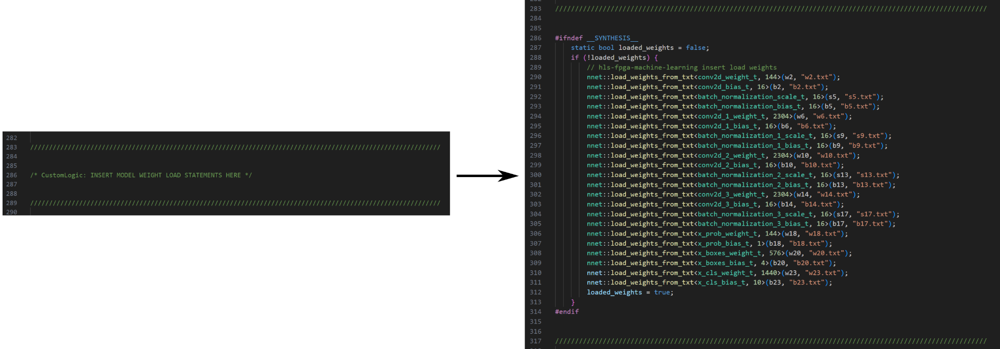

Next let's copy over the model layers (truncated for viewing, yours may have ``save_layer_output()`` statements interleaved.

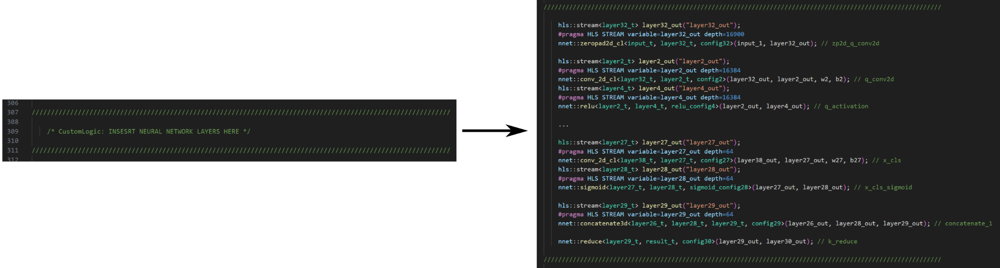

Lastly, let's copy the last layer output stream to the ``attach_results()`` function

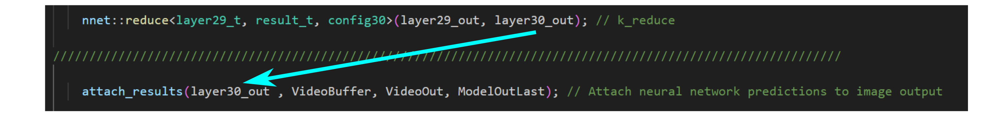

Since ``layer30_out`` is no longer the module output stream, we need to instantiate it and set a depth **before** the layer which produces it (``reduce()`` in this case). For this YOLO model, we know the output stream will have a depth of 1×8×8=64 based on the shape of our ouput data.

```cpp
    hls::stream<result_t> layer30_out("layer30_out");
    #pragma HLS STREAM variable=layer30_out depth=64
```

Now, in ``nnet_utils/nnet_helpers.h``, change ``WEIGHTS_DIR`` TO ``../../../../srcs/weights``

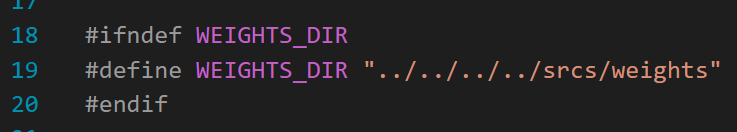

Now, in ``defines.h``, we have to add one include statement, ``#include "CustomLogic.h"``, at the top and one new type definition, ``typedef nnet::array<ap_fixed<16,8>, MONOPIX_NBR> input_arr_t;``

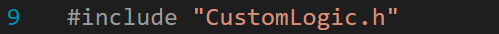

/


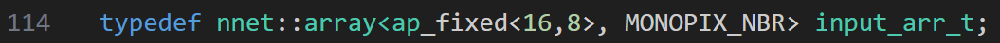

### Acquisition parameters

Finally, lets define some of the acquisition parameters in ``CustomLogic.h``. These parameters include
- ``PIXEL_FORMAT``: Specify your pixel format. Valid values are 8 or 16. If you are recording in 12-bit, write 16 here.
- ``NORM_DIV``: Divide your model's input data by this value for normailzation. In this example we will divide by 255 because we will be recording in Mono8 format.
- ``IMAGE_WIDTH``: Acuisition image width
- ``IMAGE_HEIGHT``: Acuisition image height
- ``CROP_START_X``: If you would like to crop the image input to a specific ROI, specify the start x coordinate here. If you do not wish to crop an ROI, set this to 0.
- ``CROP_START_y``: Specify the crop start y coordinate here. If you do not wish to crop an ROI, set this to 0.
- ``CROP_WIDTH``: Specify the crop width. If you do not wish to crop an ROI, set this equal to the IMAGE_WIDTH.
- ``CROP_HEIGHT``: Specify the crop height. If you do not wish to crop an ROI, set this equal to the IMAGE_HEIGHT.
- ``BLOCK_HEIGHT``: This parameter must be copied from the eGrabber interface. It will be auto-populated and can be found under Data Stream > StreamControl > BlockHeight. Enter it here.

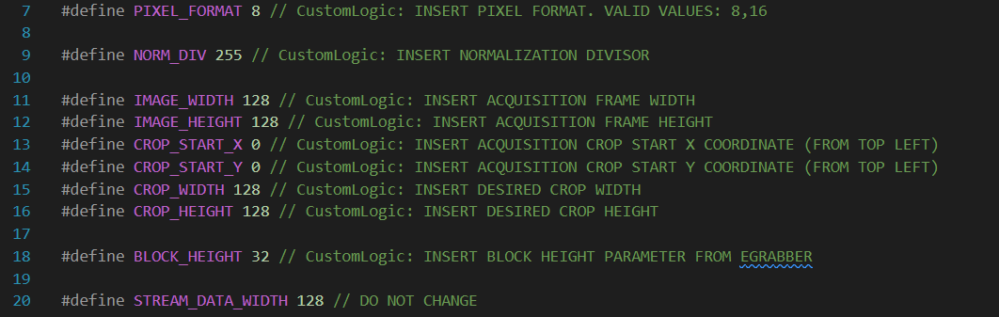

Now, at the bottom of ``CustomLogic.h`` we must enter the striping pattern which the frame grabber will receive out of the camera so the firmware can reoder the data before streaming into the model. Run the cell below to calculate the correct order. You will need to provide your image height and block height.

In [28]:
IMAGE_HEIGHT = X.shape[2]
BLOCK_HEIGHT = 32

def gen_stripe_pattern(NUM_STRIPES):
    if NUM_STRIPES % 2 != 0:
        print("NUM_STRIPES must be even")
        return None
    
    stripe_order = []
    for i in range(NUM_STRIPES):
        if i % 2 == 0:
            stripe_order.append(((NUM_STRIPES // 2) - (i // 2)) - 1)
        else:
            stripe_order.append(((NUM_STRIPES // 2) + ((i + 1) // 2)) - 1)
    
    return stripe_order

NUM_STRIPES = IMAGE_HEIGHT/(BLOCK_HEIGHT/2)
stripe_order = str(gen_stripe_pattern(int(NUM_STRIPES))).replace('[', '{').replace(']', '}')
print("Copy this array to the strip_order constant in CustomLogic.h: ", stripe_order)

Copy this array to the strip_order constant in CustomLogic.h:  {3, 4, 2, 5, 1, 6, 0, 7}



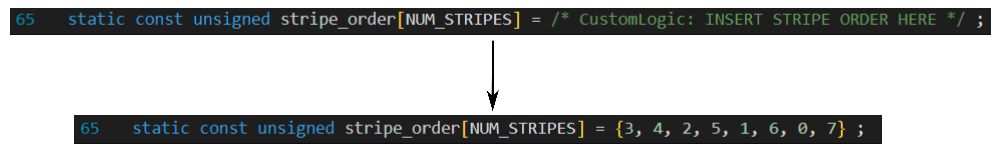

### C-simulation

Just like last time, lets save a small dataset to validate our frame grabber firmware with our Keras model via c-simulation.

In [37]:
FRAME_GRABBER_DIR = "my-frame-grabber-test_TEMPLATE/05_model_design_hls"
np.savetxt(FRAME_GRABBER_DIR + "/tb_data/tb_input_features.dat", X.reshape(X.shape[0], -1)*255.0, delimiter=' ', fmt='%d')
np.savetxt(FRAME_GRABBER_DIR + "/tb_data/tb_output_predictions.dat", np.zeros(y.shape[0:3]).reshape(y.shape[0], -1), delimiter=' ')

Now we can execute c-simulation to ensure our frame grabber firmware is producing the expected results

In [40]:
!vivado_hls {FRAME_GRABBER_DIR}/scripts/run_hls.tcl -f "csim=1 synth=0"


****** Vivado(TM) HLS - High-Level Synthesis from C, C++ and SystemC v2018.3 (64-bit)
  **** SW Build 2405991 on Thu Dec  6 23:36:41 MST 2018
  **** IP Build 2404404 on Fri Dec  7 01:43:56 MST 2018
    ** Copyright 1986-2018 Xilinx, Inc. All Rights Reserved.

source /data1/rforelli/Xilinx_2018/Vivado/2018.3/scripts/vivado_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/data1/rforelli/Xilinx_2018/Vivado/2018.3/bin/unwrapped/lnx64.o/vivado_hls'
INFO: [HLS 200-10] For user 'rforelli' on host 'correlator2.fnal.gov' (Linux_x86_64 version 3.10.0-1160.99.1.el7.x86_64) on Sat Feb 03 01:43:47 CST 2024
INFO: [HLS 200-10] On os "Scientific Linux release 7.9 (Nitrogen)"
INFO: [HLS 200-10] In directory '/home/rforelli/hls4ml-frame-grabbers'
EURESYS_INFO: [Initial path] /home/rforelli/hls4ml-frame-grabbers
EURESYS_INFO: [Script path] /home/rforelli/hls4ml-frame-grabbers/my-frame-grabber-test_TEMPLATE/05_model_design_hls/scripts
EURESYS_INFO: [Source path] /home/rforelli/hls4ml-frame-grabbers/my-f

4294451248 602978320 1073547271 1576636439 2180392977 2683738113 3220641793 3757543424 3418416 540854657 909476401 1378982241 2083918112 2621085984 3157989664 3728445712 8131104 510190193 5072321236 1518443089 2088376880 2625280544 3162184224 3732640272 4273474336 514898753 1051794198 1522893634 2092573491 2629212961 3166378784 3736834832 16256000 519605248 1090337891 5552338261 2130582569 2633407520 3170573344 3741029392 4281861376 523801873 1093481745 1462344994 2100436240 2637600032 3174767904 3745223952 4286060048 527998496 1031083537 1568249376 2104890897 2642056736 3178962464 3749418512 4257224528 499165024 1036068704 1572972384 2109876064 2646779744 3183683424 3720585024 
Processing input 6
4294447104 536123393 1073027073 1610190848 2147098656 2684518400 3254718468 3690434583 4265085200 473471264 1010374944 1580830992 2151809296 6916352632 3057596850 3627522369 4269279760 477665824 1014569504 1585027601 2088368625 2657270277 3094551077 3665271328 4273474320 481860384 1052318496 

digit: 2, prob: 1, x1: 7, y1: 11, x2: 30, y2: 34
digit: 6, prob: 1, x1: 96, y1: 27, x2: 120, y2: 51
digit: 4, prob: 1, x1: 39, y1: 62, x2: 67, y2: 90


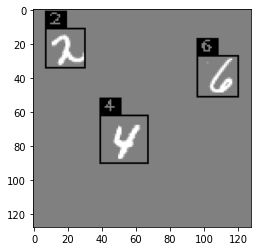

In [41]:
csim_predictions = np.genfromtxt(FRAME_GRABBER_DIR + "/tb_data/csim_results.log", delimiter=' ')
show_predict_hardware(X[0], csim_predictions[0])

## C-synthesis

Now run c-synthesis to generate the RTL representation of our design

In [ ]:
!vivado_hls {FRAME_GRABBER_DIR}/scripts/run_hls.tcl -f "csim=0 synth=1"

## Implementation

Run logic synthesis and place & route. This runtime can go long so we recommend executing the following in a command line rather in through this notebok. We use ``nohup`` for no hang up and ``&`` to put it in the background.

```bash
nohup vivado -mode tcl -source 03_scripts/run_impl.tcl &
```

## Benchmarking

RTL is written to mark the start and completion of your model inference. You may connect an oscilloscope to TTLIO11 and record the high-time to determine your model's latency.